In [24]:
!pip install scikit-image nibabel --upgrade --user
import numpy as np
import matplotlib.pyplot as plt
import glob, natsort
import pandas as pd
import nibabel as nib

from scipy.ndimage import label

     |████████████████████████████████| 13.8 MB 11.5 MB/s            
  Attempting uninstall: scikit-image
    Found existing installation: scikit-image 0.19.0
    Uninstalling scikit-image-0.19.0:
      Successfully uninstalled scikit-image-0.19.0
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.


In [25]:
list_x = natsort.natsorted(glob.glob('nnUNet_raw_data_base/nnUNet_raw_data/Task04_CardiacStenosis/imagesTs/'+'*.nii.gz'))
list_y = natsort.natsorted(glob.glob('nnUNet_raw_data_base/nnUNet_raw_data/Task04_CardiacStenosis/labelsTs/'+'*.nii.gz'))
list_yhat_1class = natsort.natsorted(glob.glob('OUTPUT_FOLDER/Task003_CardiacVessel/2d/fold_all/'+'*.nii.gz')) # vessel segmentation
list_yhat_2class = natsort.natsorted(glob.glob('OUTPUT_FOLDER/Task004_CardiacStenosis/'+'*.nii.gz')) # vessel + stenosis segmentation

len(list_x),len(list_y),len(list_yhat_1class),len(list_yhat_2class)

(39, 39, 39, 39)

In [29]:
from skimage.measure import regionprops, regionprops_table
import math

def postprocessing(mask):
    '''
    refine segmentation mask per channel
    input : 2D image (Height, Width, Channel)
    '''
    
#     mask_ori = mask.copy()
    
#     for idx in range(mask.shape[-1]):
#         if 2 in mask[...,idx]:
#             mask[...,idx]
            
    result = remove_small_objects(mask)
    return result

def postprocess(mask):
    mask = mask.astype(np.bool)
    mask = skimage.morphology.remove_small_objects(mask,200)*1
    return mask

def location(mask):
    """
    타원으로 근사하여 정상혈관의 center와 major axis를 구하여 양끝을 구한다.
    협착의 중심위치를 구하고, 3점 중에서 최소값을 값아낸다.
    
    혈관 센터, 위, 아래
    협착 센터, 위, 아래
    """
    mask = mask.astype(np.uint8)
    message = "No stenosis"
    
    if len(np.unique(mask))<=2:
        return message
    else:
        
        vessel = mask.copy()
        vessel = vessel.astype(np.uint8)
        vessel[vessel!=0] = 1
        vessel_label,vessel_idx = label(vessel)
        if vessel_idx>=2:
            print('need to check vessels')

        stenosis = mask.copy()
        stenosis[stenosis!=2] = 0
        stenosis = stenosis.astype(np.uint8)
        
        mask_regions = regionprops(mask)
        vessel_regions = regionprops(vessel)
        stenosis_regions = regionprops(stenosis)
        
        mask_props = regionprops_table(mask, properties=['label','orientation','centroid','major_axis_length','minor_axis_length','perimeter'])
#         vessel_props = regionprops_table(vessel, properties=['label','orientation','centroid','major_axis_length','minor_axis_length','perimeter'])
#         stenosis_props = regionprops_table(stenosis, properties=['label','orientation','centroid','major_axis_length','minor_axis_length','perimeter'])
                
        fig = plt.figure(figsize=(12,8))
        plt.subplot(131)        
        plt.title('All mask')
        plt.imshow(mask, cmap=plt.cm.gray)

        plt.subplot(132)        
        plt.title('vessel')
        plt.imshow(vessel, cmap=plt.cm.gray)
        
        for props in vessel_regions:
            y0, x0 = props.centroid
            orientation = props.orientation
            
            x1 = x0 - math.sin(orientation) * 0.5 * props.major_axis_length
            y1 = y0 - math.cos(orientation) * 0.5 * props.major_axis_length
            x2 = x0 + math.cos(orientation) * 0.5 * props.minor_axis_length
            y2 = y0 - math.sin(orientation) * 0.5 * props.minor_axis_length
            x3 = x0 + math.sin(orientation) * 0.5 * props.major_axis_length
            y3 = y0 + math.cos(orientation) * 0.5 * props.major_axis_length
            x4 = x0 - math.cos(orientation) * 0.5 * props.minor_axis_length
            y4 = y0 + math.sin(orientation) * 0.5 * props.minor_axis_length

            y_top_temp = y1
            y_delta_axis = np.abs(y1-y0)
            y_delta_exact = np.abs(y0-np.where(vessel==1)[0][0])
            
#             print(y0, y1, np.where(vessel==1)[0][0], y_delta_axis, y_delta_exact)

            # revised corrdinate
            x1 = x0 - math.sin(orientation) * 0.5 * props.major_axis_length*y_delta_exact/y_delta_axis
            y1 = y0 - math.cos(orientation) * 0.5 * props.major_axis_length*y_delta_exact/y_delta_axis
            x2 = x0 + math.cos(orientation) * 0.5 * props.minor_axis_length
            y2 = y0 - math.sin(orientation) * 0.5 * props.minor_axis_length
            x3 = x0 + math.sin(orientation) * 0.5 * props.major_axis_length*y_delta_exact/y_delta_axis
            y3 = y0 + math.cos(orientation) * 0.5 * props.major_axis_length*y_delta_exact/y_delta_axis
            x4 = x0 - math.cos(orientation) * 0.5 * props.minor_axis_length
            y4 = y0 + math.sin(orientation) * 0.5 * props.minor_axis_length
            
            plt.plot((x0, x1), (y0, y1), '-r', linewidth=2.5, alpha=0.5)
            plt.plot((x0, x2), (y0, y2), '-r', linewidth=2.5, alpha=0.5)
            plt.plot((x0, x3), (y0, y3), '-b', linewidth=2.5, alpha=0.5)
            plt.plot((x0, x4), (y0, y4), '-b', linewidth=2.5, alpha=0.5)
            plt.plot(x0, y0, '.g', markersize=15)
            x_vessel_center = x0
            y_vessel_center = y0
            x_vessel_top = x1
            y_vessel_top = y1
            x_vessel_bottom = x3
            y_vessel_bottom = y3
            
        plt.subplot(133)
        plt.title('stenosis')
        plt.imshow(stenosis, cmap=plt.cm.gray)
        
        for props in stenosis_regions:
            y0, x0 = props.centroid
            orientation = props.orientation
            x1 = x0 - math.sin(orientation) * 0.5 * props.major_axis_length
            y1 = y0 - math.cos(orientation) * 0.5 * props.major_axis_length
            x2 = x0 + math.cos(orientation) * 0.5 * props.minor_axis_length
            y2 = y0 - math.sin(orientation) * 0.5 * props.minor_axis_length
            x3 = x0 + math.sin(orientation) * 0.5 * props.major_axis_length
            y3 = y0 + math.cos(orientation) * 0.5 * props.major_axis_length
            x4 = x0 - math.cos(orientation) * 0.5 * props.minor_axis_length
            y4 = y0 + math.sin(orientation) * 0.5 * props.minor_axis_length

            plt.plot((x0, x1), (y0, y1), '-r', linewidth=2.5, alpha=0.5)
            plt.plot((x0, x2), (y0, y2), '-r', linewidth=2.5, alpha=0.5)
            plt.plot((x0, x3), (y0, y3), '-b', linewidth=2.5, alpha=0.5)
            plt.plot((x0, x4), (y0, y4), '-b', linewidth=2.5, alpha=0.5)
            plt.plot(x0, y0, '.g', markersize=15)
            x_stenosis_center = x0
            y_stenosis_center = y0
            x_stenosis_top = x1
            y_stenosis_top = y1
            x_stenosis_bottom = x3
            y_stenosis_bottom = y3

        plt.show()
        
        result = dict()
        result['x_vessel_center'] = x_vessel_center
        result['y_vessel_center'] = y_vessel_center
        result['x_vessel_top'] = x_stenosis_top
        result['y_vessel_top'] = y_vessel_top
        result['x_vessel_bottom'] = x_vessel_bottom
        result['y_vessel_bottom'] = y_vessel_bottom
        
        result['x_stenosis_center'] = x_stenosis_center
        result['y_stenosis_center'] = y_stenosis_center
        result['x_stenosis_top'] = x_stenosis_top
        result['y_stenosis_top'] = y_stenosis_top
        result['x_stenosis_bottom'] = x_stenosis_bottom
        result['y_stenosis_bottom'] = y_stenosis_bottom
        
        return result

In [28]:
from sklearn.metrics.pairwise import euclidean_distances
from skimage.morphology import skeletonize, medial_axis, dilation, disk, remove_small_objects
from skimage.measure import regionprops

from tqdm import trange
from scipy.ndimage import label
from scipy import ndimage

import skimage
import skimage.morphology

import scipy.ndimage as ndimage

def load_case(idx):
    '''
    load image, segmentation, segmentation using model

    Inputs
    idx : integer number, < len(list_x)==len(list_y)==len(list_yhat)
    
    Return
    x : image (height, width, depth)
    y : segmentation (height, width, depth)
    yhat : segmentation using model (height, width, depth)    
    '''
    x = nib.load(list_x[idx])
    x = x.get_fdata()
    x = np.moveaxis(x,0,1)

    y = nib.load(list_y[idx])
    y = y.get_fdata()
    y = np.moveaxis(y,0,1)

    yhat_1 = nib.load(list_yhat_1class[idx])  # vessel segmentation
    yhat_1 = yhat_1.get_fdata()
    yhat_1 = np.moveaxis(yhat_1,0,1)
    yhat_1 = postprocess(yhat_1)
    
    yhat_2 = nib.load(list_yhat_2class[idx]) # vessel + stenosis segmentation
    yhat_2 = yhat_2.get_fdata()
    yhat_2 = np.moveaxis(yhat_2,0,1)
    yhat_2[yhat_2!=2] = 0
    yhat_2[yhat_2!=0] = 1
    
    for i in range(yhat_2.shape[-1]): # fill in holes
        yhat_2[...,i] = ndimage.binary_fill_holes(yhat_2[...,i]).astype(int) * 2 
    
    yhat = yhat_1 + yhat_2
    yhat[yhat>=2] = 2   
    
    # yhat_unique = np.unique(yhat)
    return x,y,yhat

def skel_dist(x,y,yhat,show=False):
    '''
    Get skeleton and distance map of Stacked 2D image

    Inputs
    x : image (height, width, depth)
    y : segmentation (height, width, depth)
    yhat : segmentation using model (height, width, depth)
    show : want to see image?
    
    Return
    skeletons, distances
    '''
    skeletons = []
    distances = []
    
    for idx_slice in range(yhat.shape[-1]):
        image = x[...,idx_slice].copy()
        label = yhat[...,idx_slice].copy()
        # label = postprocess(label)
        skeleton, distance = medial_axis(label, return_distance=True)
        skeletons.append(skeleton)
        distances.append(distance)

        if show:
            plt.figure(figsize=(16,16))
            plt.subplot(131)
            plt.imshow(image,cmap='gray')
            plt.title(f'Input image_{idx_slice}')
            plt.axis('off')
            plt.subplot(132)
            plt.imshow(label,cmap='gray')
            plt.title('AI segmentated')
            plt.axis('off')
            plt.subplot(133)
            plt.imshow(distance,cmap='gray')
            plt.title('Distance map using AI segmentated')
            plt.axis('off')
            plt.tight_layout()
            plt.show()
            
    return np.moveaxis(np.array(skeletons),0,-1), np.moveaxis(np.array(distances),0,-1)

# !pip install fil_finder astropy==4.3.1 typing 

import numpy as np
import cv2
import matplotlib.pyplot as plt
import monai
import torch
    
from fil_finder import FilFinder2D
import astropy.units as u

def skeletion_analysis(image, seg, skeleton):
    '''
    filament anaylsis
    
    image : 2d image
    seg : 2d segmentation mask
    skeleton : 2d skeleton using seg, scikit-learn was used.
    '''
    
    # fil = FilFinder2D(distance, mask = skeleton)
    fil = FilFinder2D(image, mask = skeleton)
    # filfind.preprocess_image(flatten_percent=85)
    fil.create_mask(border_masking = True, verbose = False, use_existing_mask = True)
    fil.medskel(verbose = False)
    fil.analyze_skeletons(branch_thresh = 10 * u.pix, skel_thresh = 10 * u.pix, prune_criteria = 'all')
    # fil.analyze_skeletons(branch_thresh = 10 * u.pix, skel_thresh = 10 * u.pix, prune_criteria = 'all', verbose=True)

    # Show the longest path
    plt.figure(figsize=(20,8))
    plt.subplot(131)
    plt.imshow(image, cmap = 'gray')
    plt.imshow(fil.skeleton, cmap = 'gray',alpha=0.1)
    plt.contour(fil.skeleton_longpath, colors = 'r')
    plt.tight_layout()
    plt.axis('off')

    plt.subplot(132)
    plt.imshow(seg, cmap = 'gray')
    plt.contour(seg)
    plt.tight_layout()
    plt.axis('off')

    # print(len(fil.filaments))
    fil1 = fil.filaments[0]
    plt.subplot(133)
    plt.plot(fil1.ridge_profile(fil.image))
    plt.xlabel('Length(Pixel)')
    plt.ylabel('Thickness(Pixel)')
    plt.tight_layout()
    plt.show()

/tmp/ipykernel_2842/1864555067.py:20: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = mask.astype(np.bool)


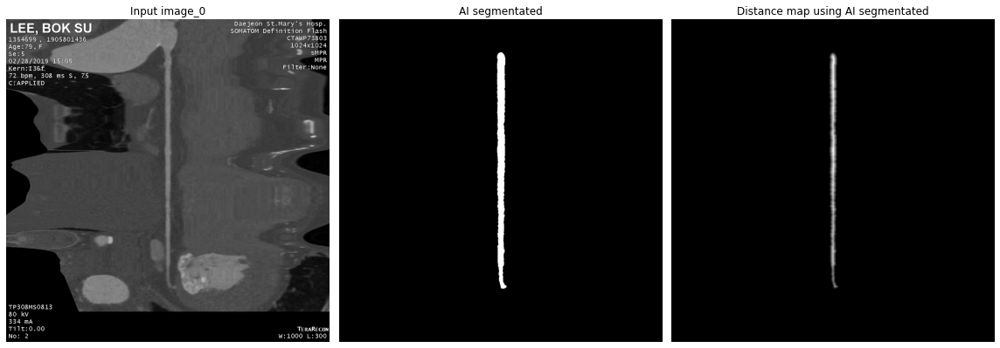

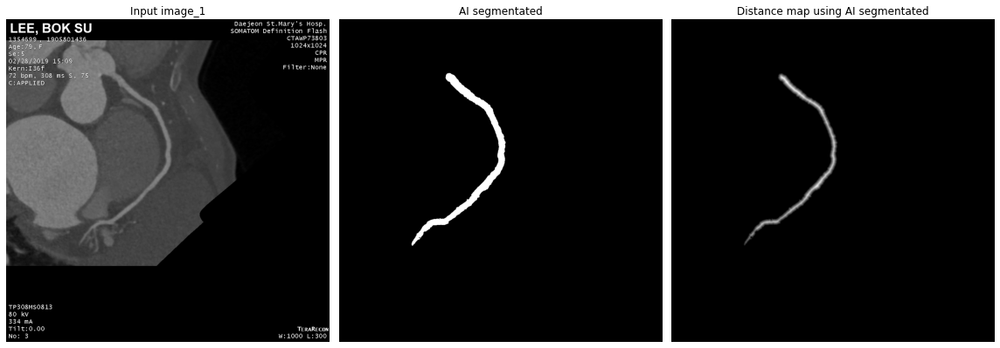

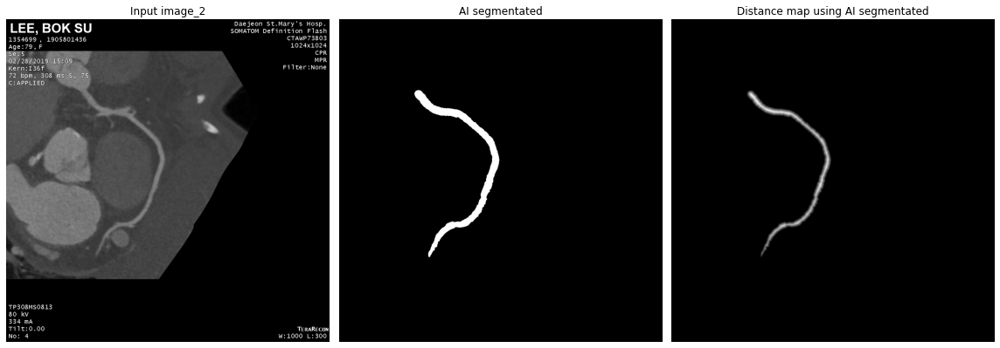

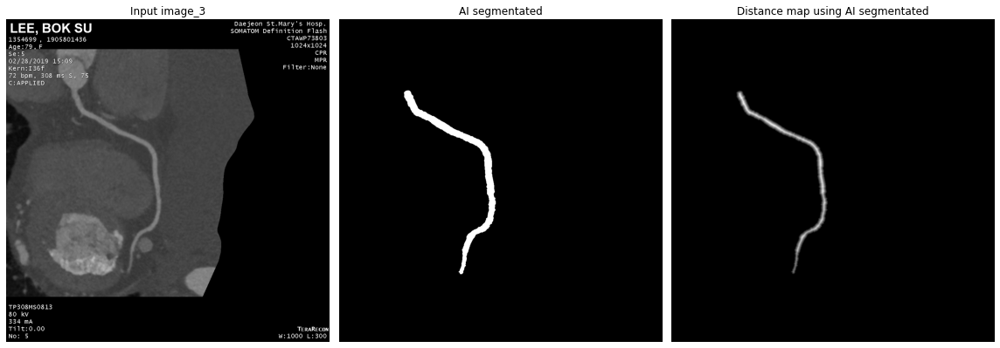

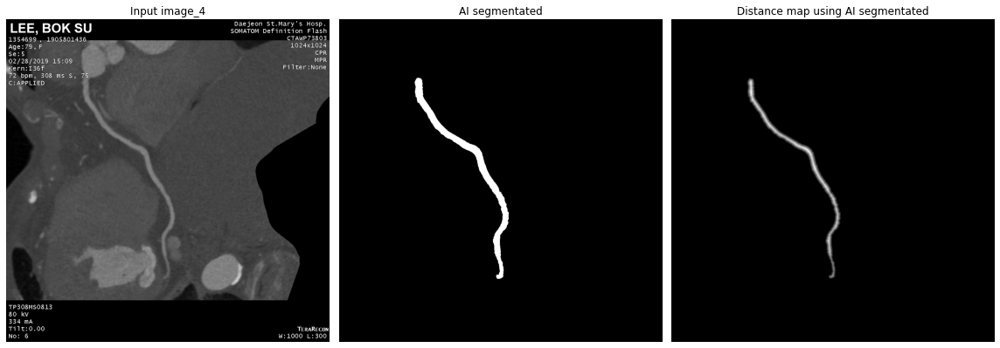

...

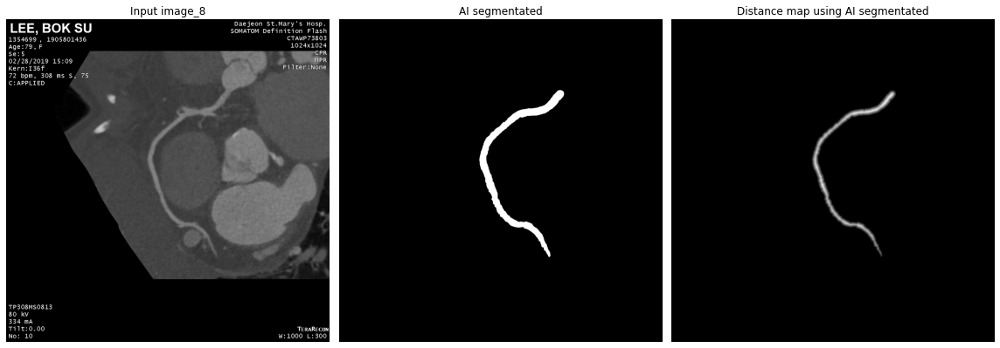

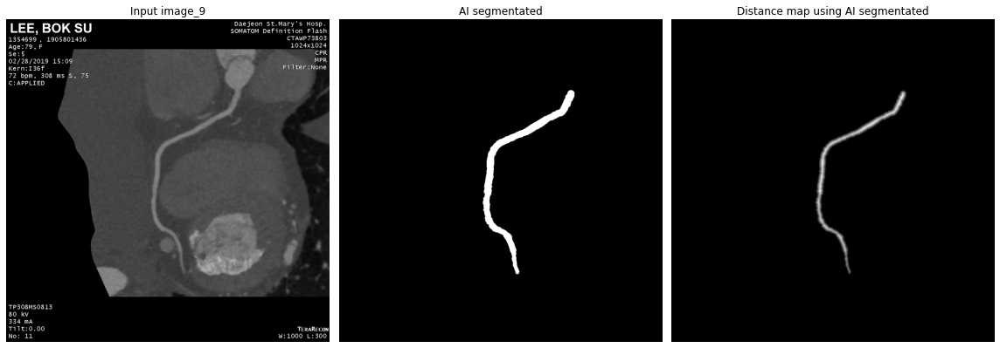

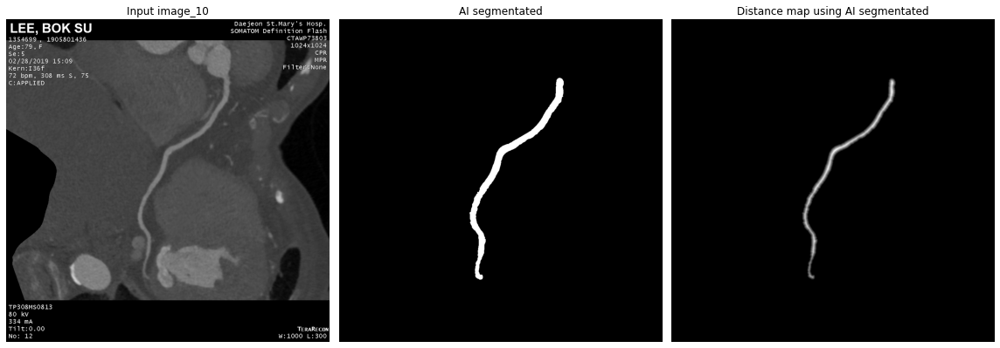

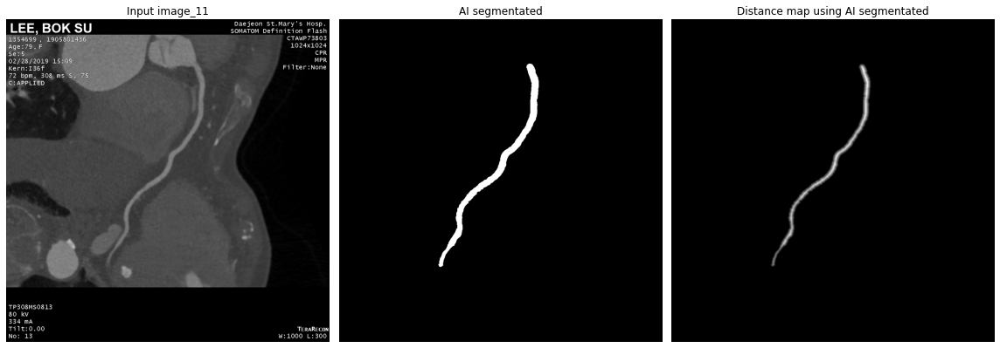

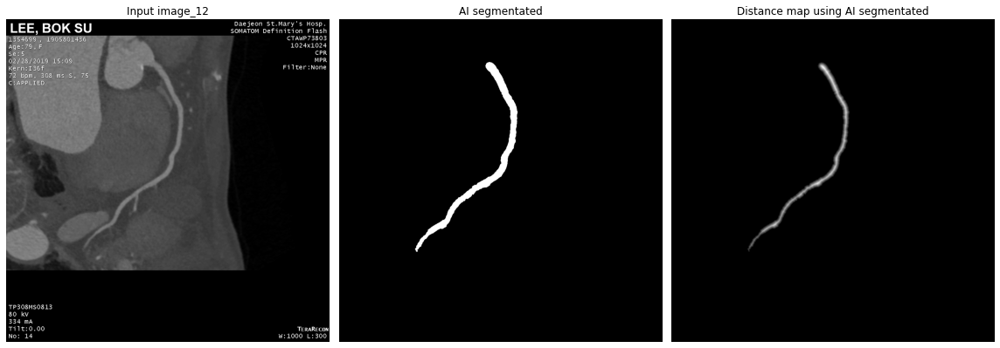

In [30]:
# data loading test
idx = 0
x,y,yhat = load_case(idx)
_ = skel_dist(x,y,yhat,True)

nnUNet_raw_data_base/nnUNet_raw_data/Task04_CardiacStenosis/imagesTs/750_1223.nii.gz


/tmp/ipykernel_2842/1864555067.py:20: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = mask.astype(np.bool)
/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filfinder2D.py:142: UserWarning: No beam width given. Using 0 pixels.
  warnings.warn("No beam width given. Using 0 pixels.")
/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filfinder2D.py:296: UserWarning: Using inputted mask. Skipping creation of anew mask.
  warnings.warn("Using inputted mask. Skipping creation of a"
/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filament.py:326: UserWarning: Graph pruning reached max iterations.
  warnings.warn("Graph pruning reached max iter

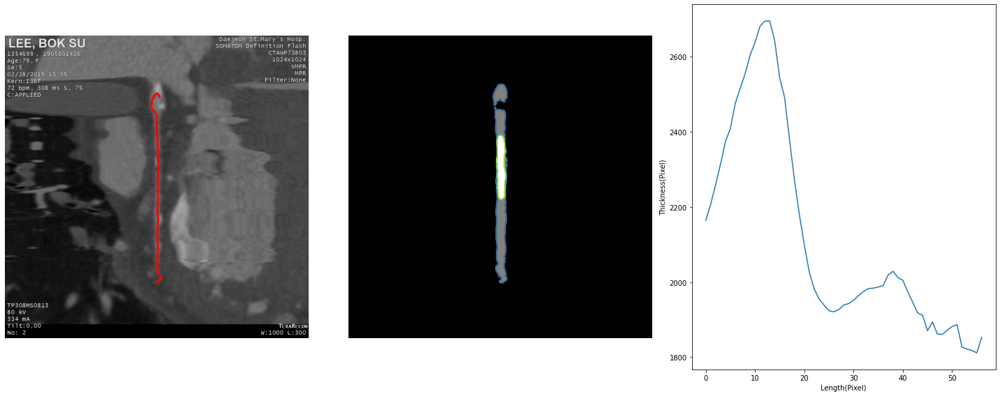

/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filfinder2D.py:142: UserWarning: No beam width given. Using 0 pixels.
  warnings.warn("No beam width given. Using 0 pixels.")
/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filfinder2D.py:296: UserWarning: Using inputted mask. Skipping creation of anew mask.
  warnings.warn("Using inputted mask. Skipping creation of a"
/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filament.py:326: UserWarning: Graph pruning reached max iterations.
  warnings.warn("Graph pruning reached max iterations.")


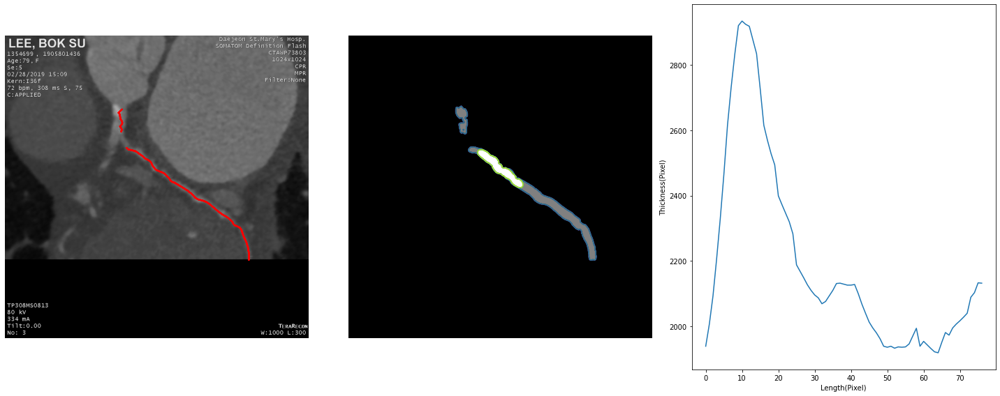

/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filfinder2D.py:142: UserWarning: No beam width given. Using 0 pixels.
  warnings.warn("No beam width given. Using 0 pixels.")
/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filfinder2D.py:296: UserWarning: Using inputted mask. Skipping creation of anew mask.
  warnings.warn("Using inputted mask. Skipping creation of a"
/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filament.py:326: UserWarning: Graph pruning reached max iterations.
  warnings.warn("Graph pruning reached max iterations.")


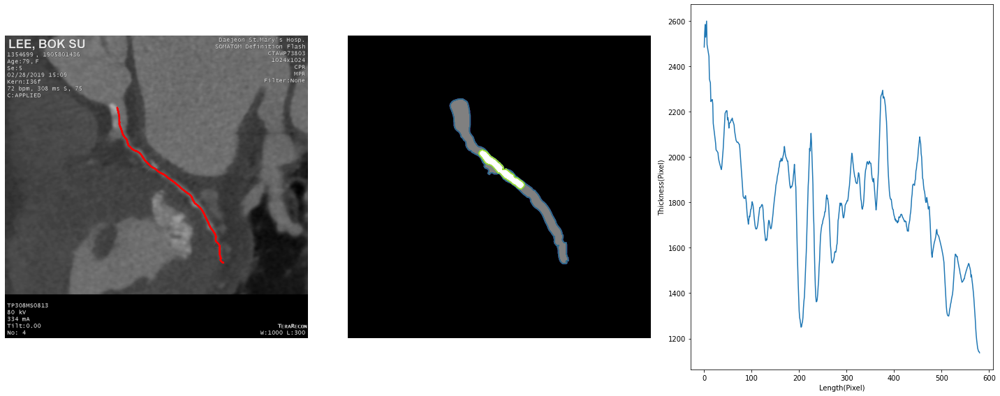

/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filfinder2D.py:142: UserWarning: No beam width given. Using 0 pixels.
  warnings.warn("No beam width given. Using 0 pixels.")
/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filfinder2D.py:296: UserWarning: Using inputted mask. Skipping creation of anew mask.
  warnings.warn("Using inputted mask. Skipping creation of a"
/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filament.py:326: UserWarning: Graph pruning reached max iterations.
  warnings.warn("Graph pruning reached max iterations.")


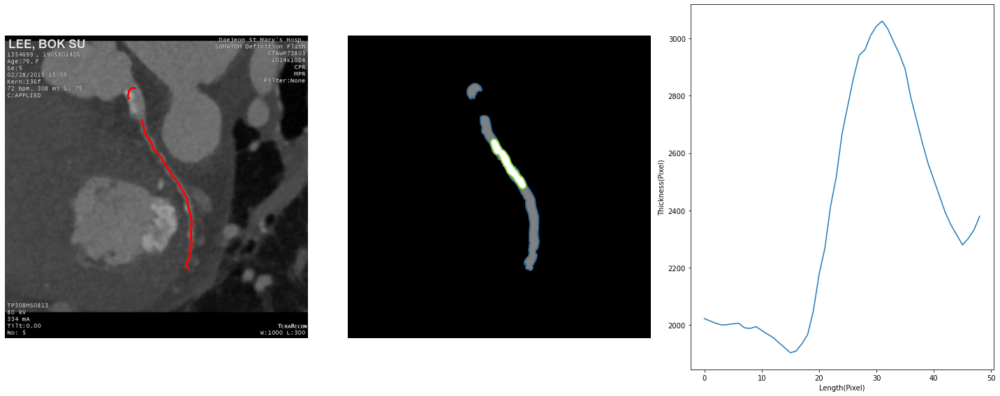

/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filfinder2D.py:142: UserWarning: No beam width given. Using 0 pixels.
  warnings.warn("No beam width given. Using 0 pixels.")
/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filfinder2D.py:296: UserWarning: Using inputted mask. Skipping creation of anew mask.
  warnings.warn("Using inputted mask. Skipping creation of a"
/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filament.py:326: UserWarning: Graph pruning reached max iterations.
  warnings.warn("Graph pruning reached max iterations.")


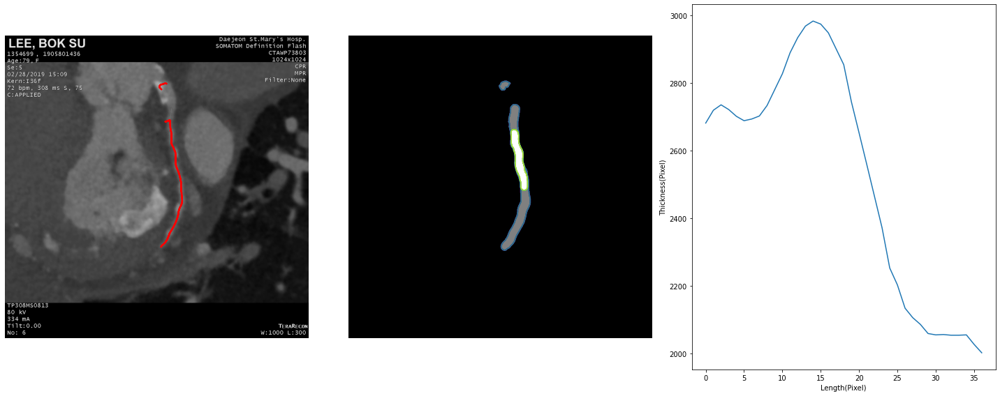

/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filfinder2D.py:142: UserWarning: No beam width given. Using 0 pixels.
  warnings.warn("No beam width given. Using 0 pixels.")
/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filfinder2D.py:296: UserWarning: Using inputted mask. Skipping creation of anew mask.
  warnings.warn("Using inputted mask. Skipping creation of a"
/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filament.py:326: UserWarning: Graph pruning reached max iterations.
  warnings.warn("Graph pruning reached max iterations.")


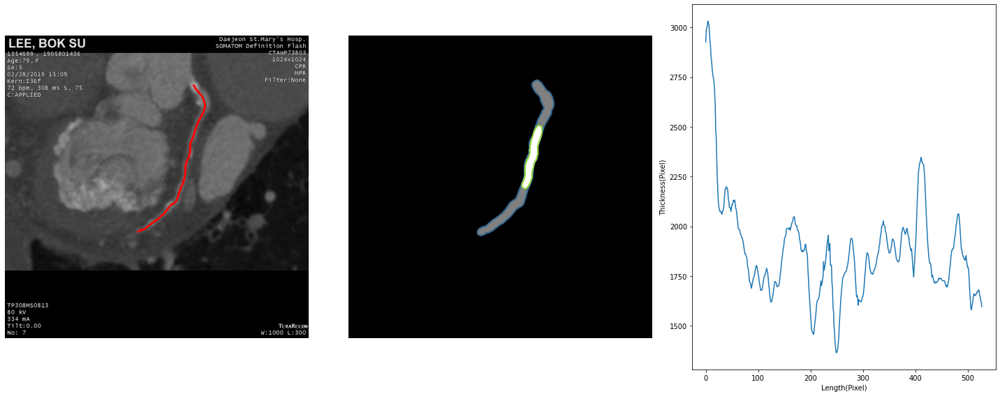

/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filfinder2D.py:142: UserWarning: No beam width given. Using 0 pixels.
  warnings.warn("No beam width given. Using 0 pixels.")
/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filfinder2D.py:296: UserWarning: Using inputted mask. Skipping creation of anew mask.
  warnings.warn("Using inputted mask. Skipping creation of a"
/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filament.py:326: UserWarning: Graph pruning reached max iterations.
  warnings.warn("Graph pruning reached max iterations.")


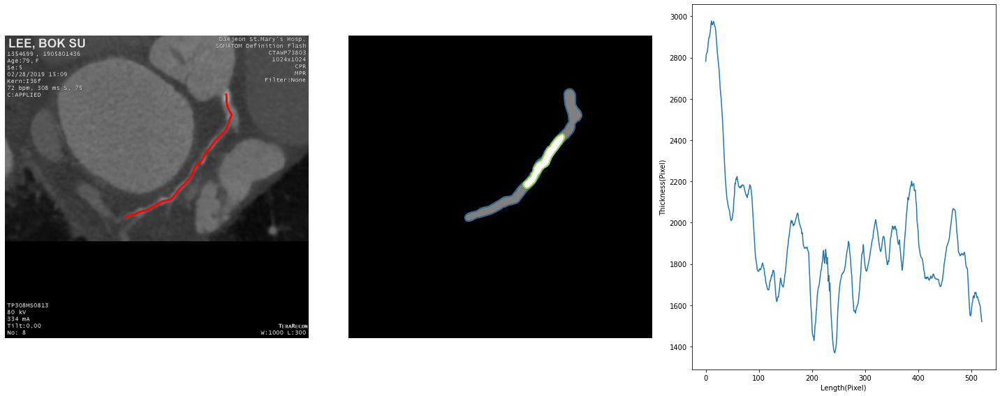

/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filfinder2D.py:142: UserWarning: No beam width given. Using 0 pixels.
  warnings.warn("No beam width given. Using 0 pixels.")
/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filfinder2D.py:296: UserWarning: Using inputted mask. Skipping creation of anew mask.
  warnings.warn("Using inputted mask. Skipping creation of a"
/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filament.py:326: UserWarning: Graph pruning reached max iterations.
  warnings.warn("Graph pruning reached max iterations.")


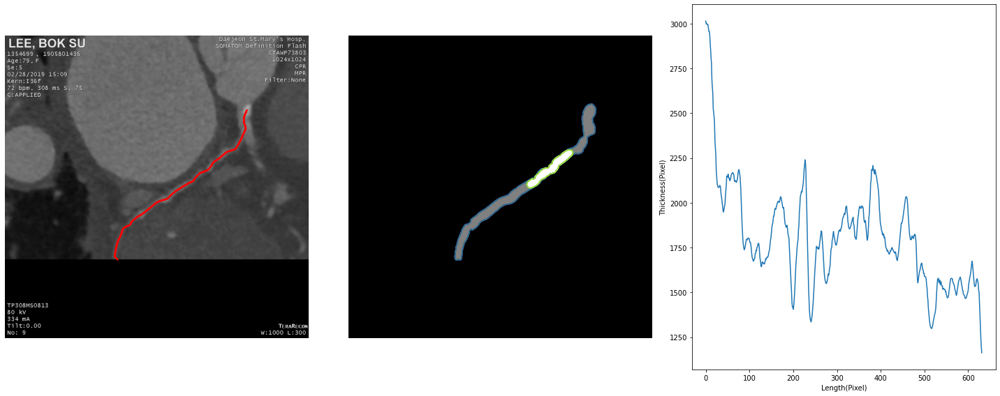

/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filfinder2D.py:142: UserWarning: No beam width given. Using 0 pixels.
  warnings.warn("No beam width given. Using 0 pixels.")
/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filfinder2D.py:296: UserWarning: Using inputted mask. Skipping creation of anew mask.
  warnings.warn("Using inputted mask. Skipping creation of a"
/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filament.py:326: UserWarning: Graph pruning reached max iterations.
  warnings.warn("Graph pruning reached max iterations.")


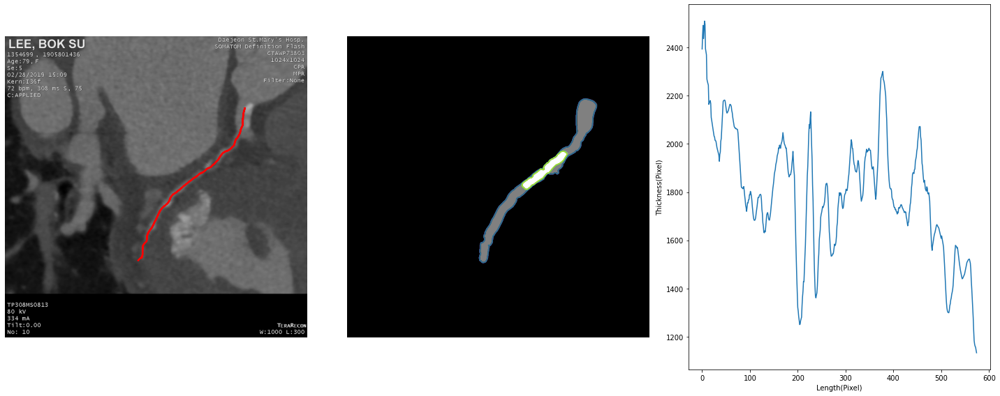

/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filfinder2D.py:142: UserWarning: No beam width given. Using 0 pixels.
  warnings.warn("No beam width given. Using 0 pixels.")
/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filfinder2D.py:296: UserWarning: Using inputted mask. Skipping creation of anew mask.
  warnings.warn("Using inputted mask. Skipping creation of a"
/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filament.py:326: UserWarning: Graph pruning reached max iterations.
  warnings.warn("Graph pruning reached max iterations.")


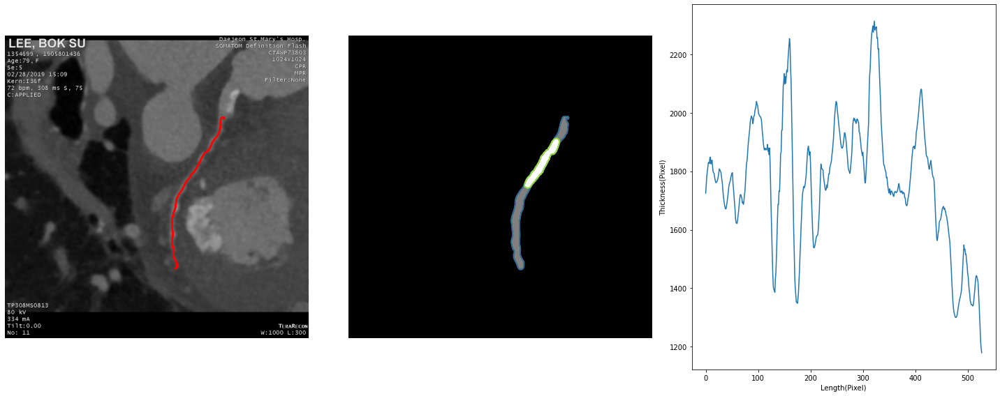

/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filfinder2D.py:142: UserWarning: No beam width given. Using 0 pixels.
  warnings.warn("No beam width given. Using 0 pixels.")
/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filfinder2D.py:296: UserWarning: Using inputted mask. Skipping creation of anew mask.
  warnings.warn("Using inputted mask. Skipping creation of a"
/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filament.py:326: UserWarning: Graph pruning reached max iterations.
  warnings.warn("Graph pruning reached max iterations.")


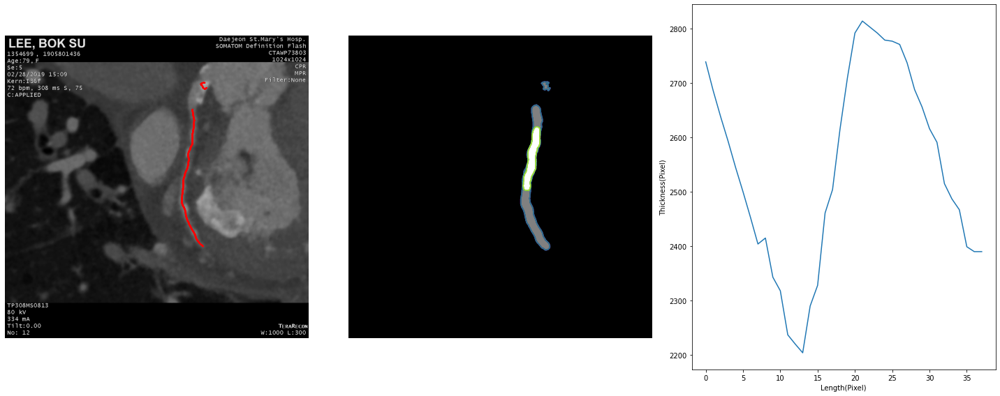

/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filfinder2D.py:142: UserWarning: No beam width given. Using 0 pixels.
  warnings.warn("No beam width given. Using 0 pixels.")
/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filfinder2D.py:296: UserWarning: Using inputted mask. Skipping creation of anew mask.
  warnings.warn("Using inputted mask. Skipping creation of a"
/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filament.py:326: UserWarning: Graph pruning reached max iterations.
  warnings.warn("Graph pruning reached max iterations.")


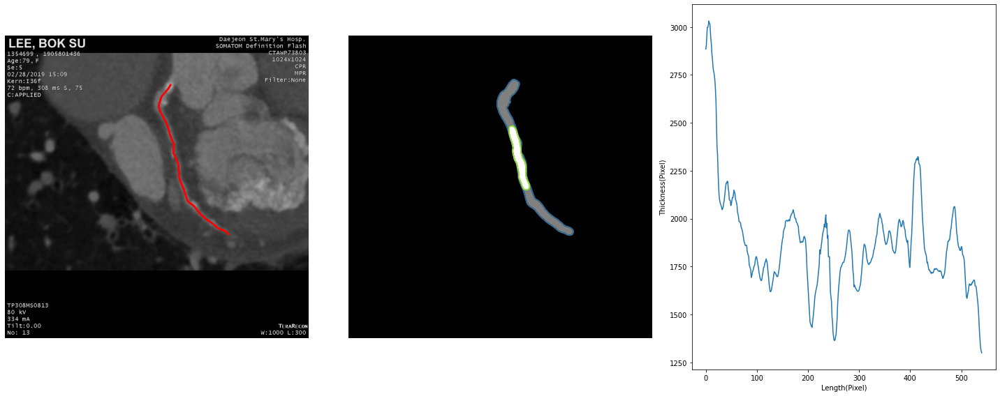

/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filfinder2D.py:142: UserWarning: No beam width given. Using 0 pixels.
  warnings.warn("No beam width given. Using 0 pixels.")
/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filfinder2D.py:296: UserWarning: Using inputted mask. Skipping creation of anew mask.
  warnings.warn("Using inputted mask. Skipping creation of a"
/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filament.py:326: UserWarning: Graph pruning reached max iterations.
  warnings.warn("Graph pruning reached max iterations.")


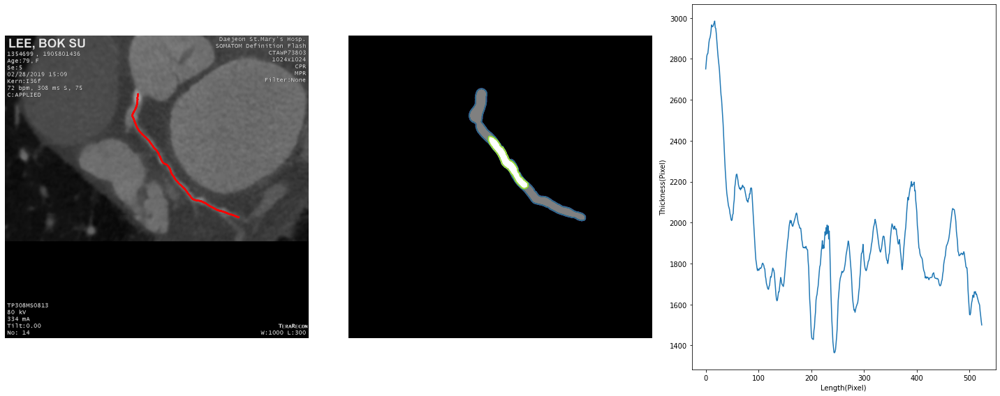

In [31]:
idx = 2
print(list_x[idx])
x,y,yhat = load_case(idx) # x,y,yhat (height, width, depth) 
skeleton,distance = skel_dist(x,y,yhat) # skeleton, distance (height, width, depth)

for idx_slice in range(skeleton.shape[-1]):
    skeletion_analysis(x[...,idx_slice],yhat[...,idx_slice],skeleton[...,idx_slice])

/tmp/ipykernel_2842/1864555067.py:20: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = mask.astype(np.bool)
/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filfinder2D.py:142: UserWarning: No beam width given. Using 0 pixels.
  warnings.warn("No beam width given. Using 0 pixels.")
/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filfinder2D.py:296: UserWarning: Using inputted mask. Skipping creation of anew mask.
  warnings.warn("Using inputted mask. Skipping creation of a"
/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filament.py:326: UserWarning: Graph pruning reached max iterations.
  warnings.warn("Graph pruning reached max iter

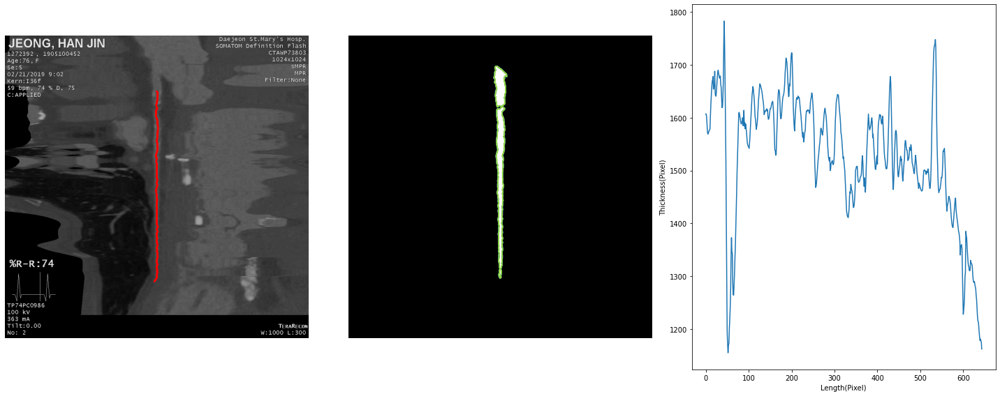

/tmp/ipykernel_2842/1864555067.py:20: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = mask.astype(np.bool)
/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filfinder2D.py:142: UserWarning: No beam width given. Using 0 pixels.
  warnings.warn("No beam width given. Using 0 pixels.")
/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filfinder2D.py:296: UserWarning: Using inputted mask. Skipping creation of anew mask.
  warnings.warn("Using inputted mask. Skipping creation of a"
/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filament.py:326: UserWarning: Graph pruning reached max iterations.
  warnings.warn("Graph pruning reached max iter

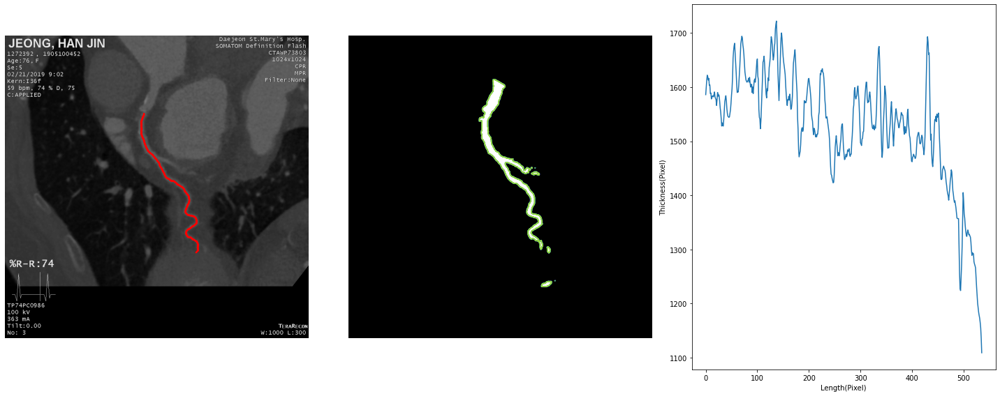

/tmp/ipykernel_2842/1864555067.py:20: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = mask.astype(np.bool)
/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filfinder2D.py:142: UserWarning: No beam width given. Using 0 pixels.
  warnings.warn("No beam width given. Using 0 pixels.")
/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filfinder2D.py:296: UserWarning: Using inputted mask. Skipping creation of anew mask.
  warnings.warn("Using inputted mask. Skipping creation of a"
/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filament.py:326: UserWarning: Graph pruning reached max iterations.
  warnings.warn("Graph pruning reached max iter

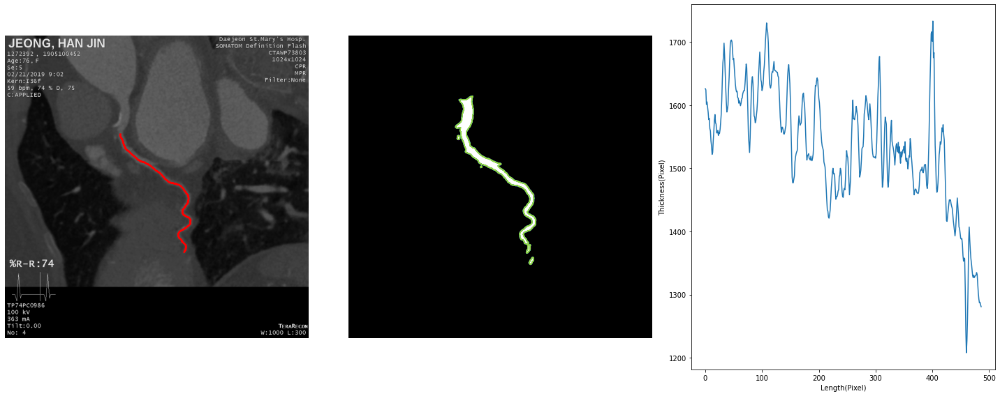

/tmp/ipykernel_2842/1864555067.py:20: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = mask.astype(np.bool)
/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filfinder2D.py:142: UserWarning: No beam width given. Using 0 pixels.
  warnings.warn("No beam width given. Using 0 pixels.")
/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filfinder2D.py:296: UserWarning: Using inputted mask. Skipping creation of anew mask.
  warnings.warn("Using inputted mask. Skipping creation of a"
/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filament.py:326: UserWarning: Graph pruning reached max iterations.
  warnings.warn("Graph pruning reached max iter

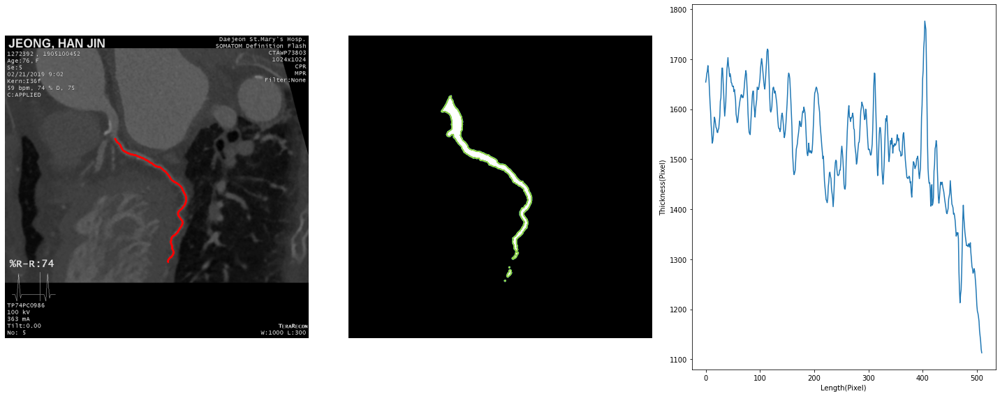

/tmp/ipykernel_2842/1864555067.py:20: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = mask.astype(np.bool)
/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filfinder2D.py:142: UserWarning: No beam width given. Using 0 pixels.
  warnings.warn("No beam width given. Using 0 pixels.")
/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filfinder2D.py:296: UserWarning: Using inputted mask. Skipping creation of anew mask.
  warnings.warn("Using inputted mask. Skipping creation of a"
/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filament.py:326: UserWarning: Graph pruning reached max iterations.
  warnings.warn("Graph pruning reached max iter

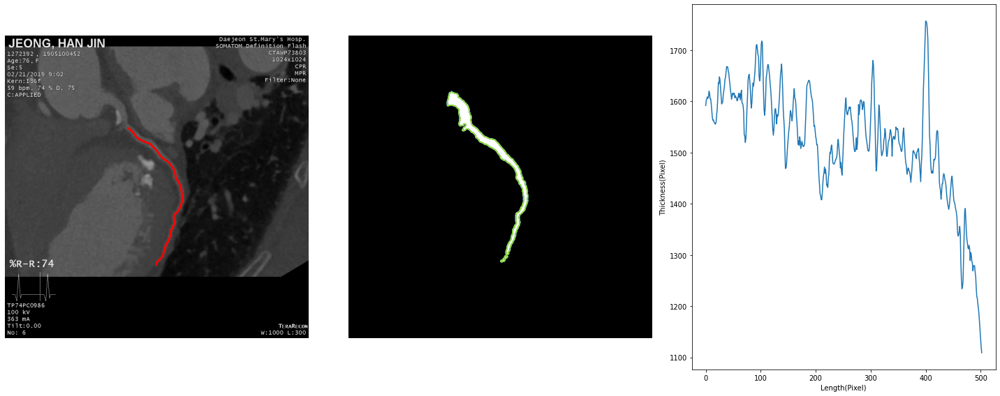

/tmp/ipykernel_2842/1864555067.py:20: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = mask.astype(np.bool)
/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filfinder2D.py:142: UserWarning: No beam width given. Using 0 pixels.
  warnings.warn("No beam width given. Using 0 pixels.")
/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filfinder2D.py:296: UserWarning: Using inputted mask. Skipping creation of anew mask.
  warnings.warn("Using inputted mask. Skipping creation of a"
/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filament.py:326: UserWarning: Graph pruning reached max iterations.
  warnings.warn("Graph pruning reached max iter

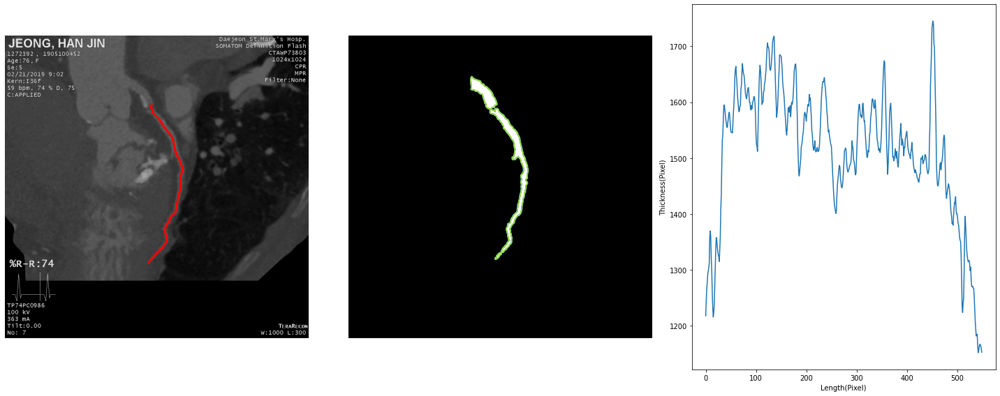

/tmp/ipykernel_2842/1864555067.py:20: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = mask.astype(np.bool)
/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filfinder2D.py:142: UserWarning: No beam width given. Using 0 pixels.
  warnings.warn("No beam width given. Using 0 pixels.")
/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filfinder2D.py:296: UserWarning: Using inputted mask. Skipping creation of anew mask.
  warnings.warn("Using inputted mask. Skipping creation of a"
/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filament.py:326: UserWarning: Graph pruning reached max iterations.
  warnings.warn("Graph pruning reached max iter

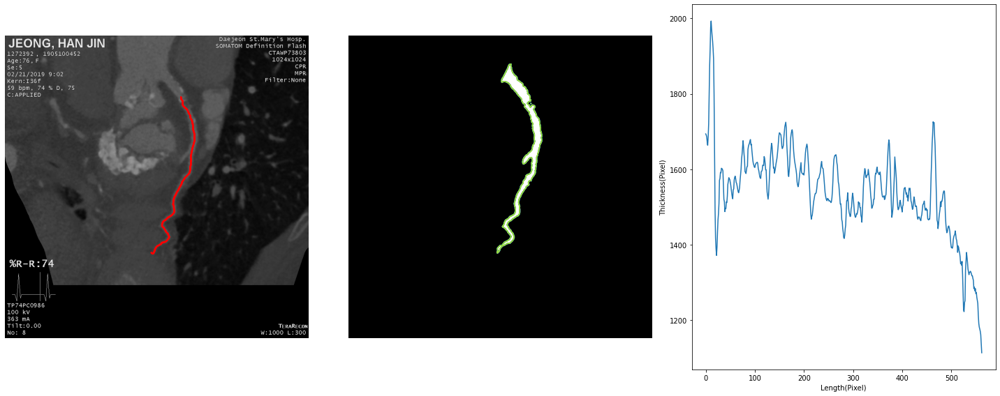

/tmp/ipykernel_2842/1864555067.py:20: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = mask.astype(np.bool)
/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filfinder2D.py:142: UserWarning: No beam width given. Using 0 pixels.
  warnings.warn("No beam width given. Using 0 pixels.")
/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filfinder2D.py:296: UserWarning: Using inputted mask. Skipping creation of anew mask.
  warnings.warn("Using inputted mask. Skipping creation of a"
/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filament.py:326: UserWarning: Graph pruning reached max iterations.
  warnings.warn("Graph pruning reached max iter

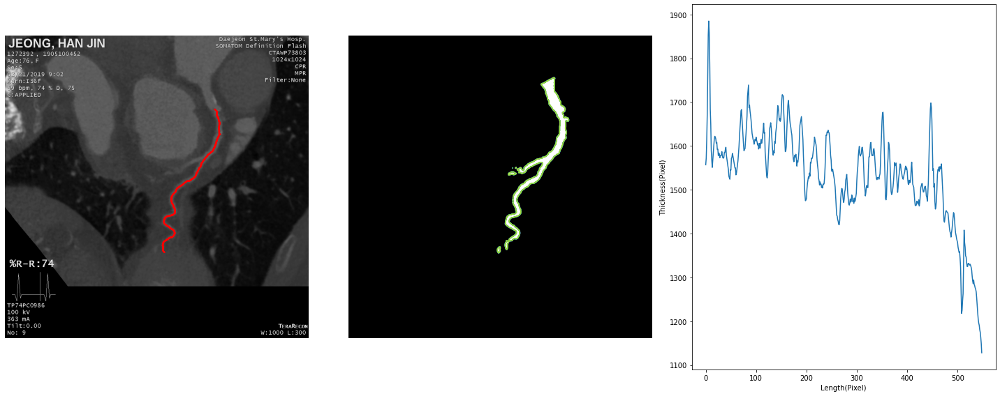

/tmp/ipykernel_2842/1864555067.py:20: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = mask.astype(np.bool)
/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filfinder2D.py:142: UserWarning: No beam width given. Using 0 pixels.
  warnings.warn("No beam width given. Using 0 pixels.")
/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filfinder2D.py:296: UserWarning: Using inputted mask. Skipping creation of anew mask.
  warnings.warn("Using inputted mask. Skipping creation of a"
/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filament.py:326: UserWarning: Graph pruning reached max iterations.
  warnings.warn("Graph pruning reached max iter

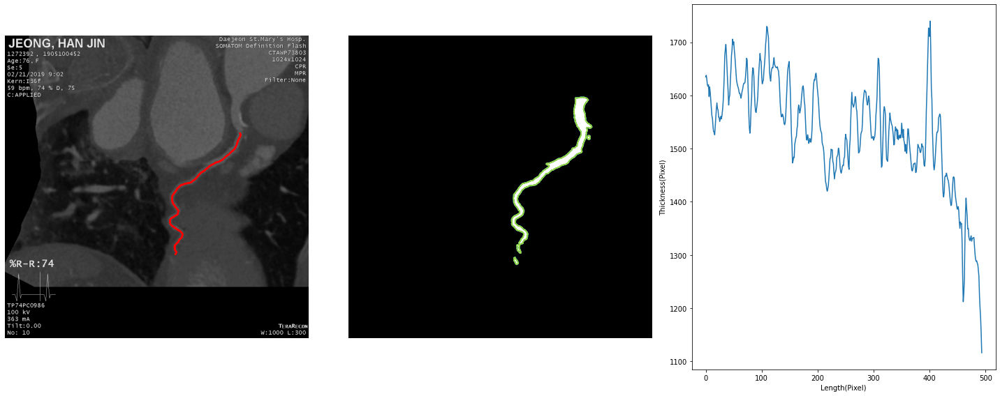

/tmp/ipykernel_2842/1864555067.py:20: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = mask.astype(np.bool)
/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filfinder2D.py:142: UserWarning: No beam width given. Using 0 pixels.
  warnings.warn("No beam width given. Using 0 pixels.")
/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filfinder2D.py:296: UserWarning: Using inputted mask. Skipping creation of anew mask.
  warnings.warn("Using inputted mask. Skipping creation of a"
/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filament.py:326: UserWarning: Graph pruning reached max iterations.
  warnings.warn("Graph pruning reached max iter

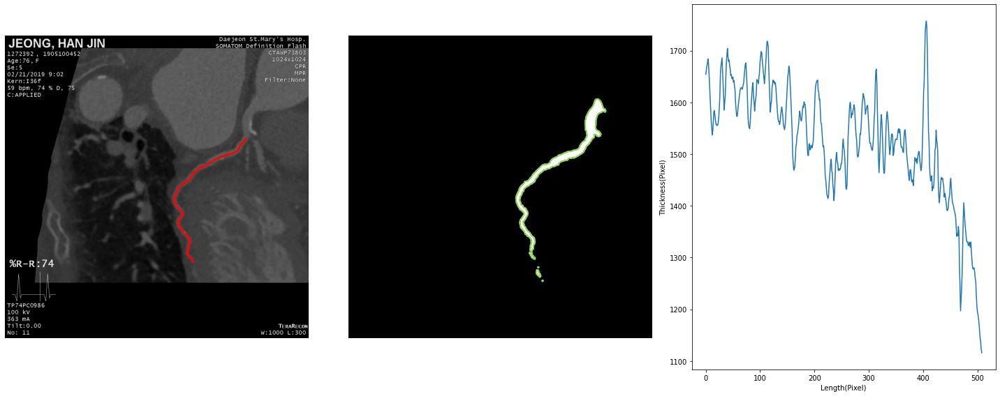

/tmp/ipykernel_2842/1864555067.py:20: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = mask.astype(np.bool)
/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filfinder2D.py:142: UserWarning: No beam width given. Using 0 pixels.
  warnings.warn("No beam width given. Using 0 pixels.")
/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filfinder2D.py:296: UserWarning: Using inputted mask. Skipping creation of anew mask.
  warnings.warn("Using inputted mask. Skipping creation of a"
/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filament.py:326: UserWarning: Graph pruning reached max iterations.
  warnings.warn("Graph pruning reached max iter

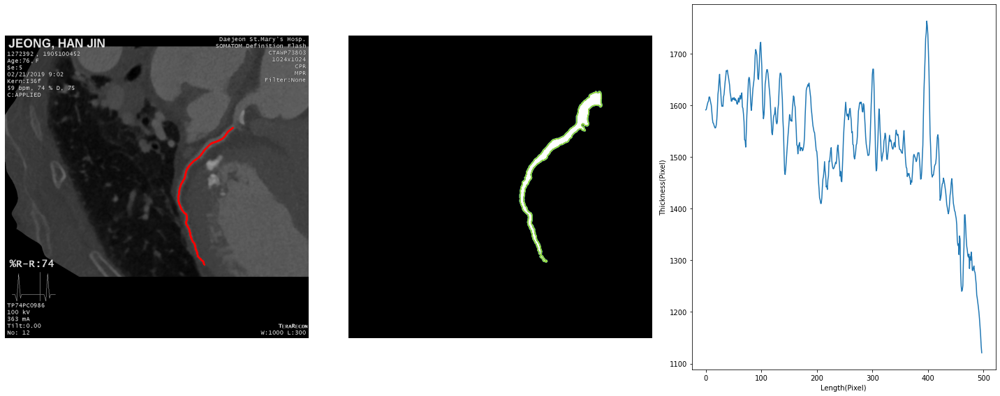

/tmp/ipykernel_2842/1864555067.py:20: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = mask.astype(np.bool)
/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filfinder2D.py:142: UserWarning: No beam width given. Using 0 pixels.
  warnings.warn("No beam width given. Using 0 pixels.")
/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filfinder2D.py:296: UserWarning: Using inputted mask. Skipping creation of anew mask.
  warnings.warn("Using inputted mask. Skipping creation of a"
/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filament.py:326: UserWarning: Graph pruning reached max iterations.
  warnings.warn("Graph pruning reached max iter

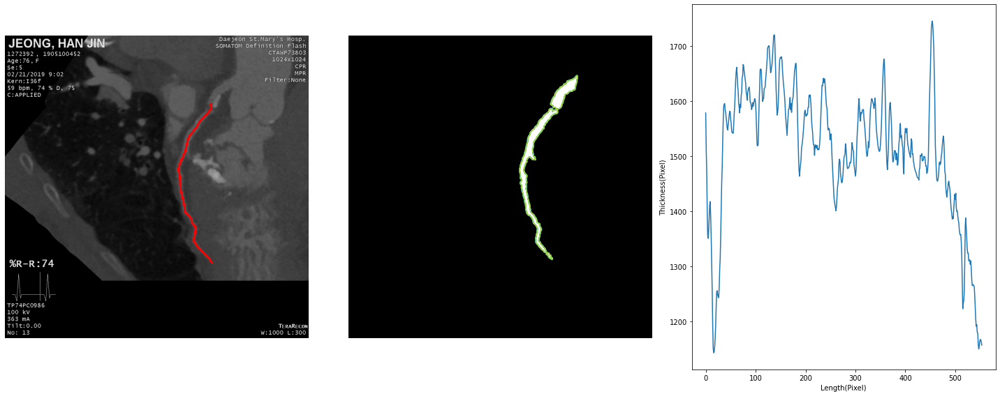

/tmp/ipykernel_2842/1864555067.py:20: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = mask.astype(np.bool)
/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filfinder2D.py:142: UserWarning: No beam width given. Using 0 pixels.
  warnings.warn("No beam width given. Using 0 pixels.")
/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filfinder2D.py:296: UserWarning: Using inputted mask. Skipping creation of anew mask.
  warnings.warn("Using inputted mask. Skipping creation of a"
/home/kevin/.local/lib/python3.8/site-packages/fil_finder/filament.py:326: UserWarning: Graph pruning reached max iterations.
  warnings.warn("Graph pruning reached max iter

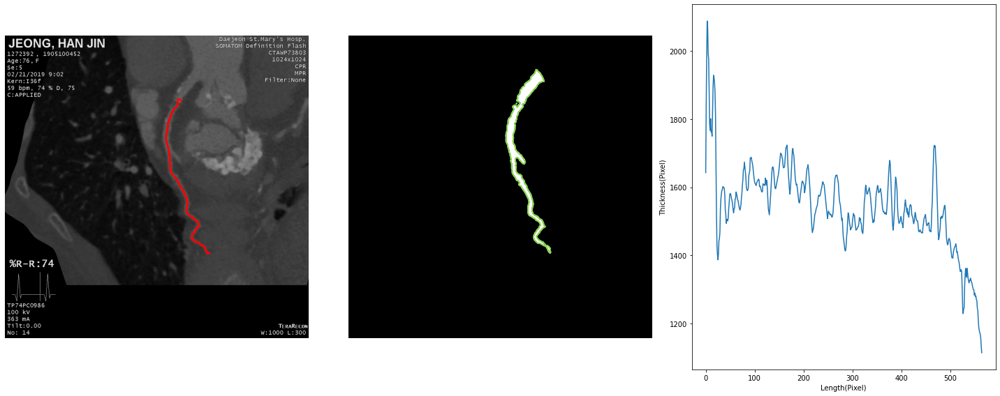

IndexError: index 13 is out of bounds for axis 2 with size 13

In [32]:
idx = 5
x,y,yhat = load_case(idx)

# for idx in range(1):
for idx_slice in range(len(x)):
    image = x[...,idx_slice].copy()
    seg = y[...,idx_slice].copy()
    label = yhat[...,idx_slice].copy()
    label = postprocess(label)

    skeleton,distance = medial_axis(label, return_distance=True)
    
    # fil = FilFinder2D(distance, mask = skeleton)
    fil = FilFinder2D(image, mask = skeleton)
    # fil.preprocess_image(flatten_percent=85)
    fil.create_mask(border_masking = True, verbose = False, use_existing_mask = True)
    fil.medskel(verbose = False)
    fil.analyze_skeletons(branch_thresh = 10 * u.pix, skel_thresh = 10 * u.pix, prune_criteria = 'all')
    # fil.analyze_skeletons(branch_thresh = 10 * u.pix, skel_thresh = 10 * u.pix, prune_criteria = 'all', verbose=True)
    # plt.imshow(fil.preprocess_image)
    # plt.show()
    # Show the longest path
    plt.figure(figsize=(20,8))
    plt.subplot(131)
    plt.imshow(image, cmap = 'gray')
    plt.imshow(fil.skeleton, cmap = 'gray',alpha=0.1)
    plt.contour(fil.skeleton_longpath, colors = 'r')
    plt.tight_layout()
    plt.axis('off')

    plt.subplot(132)
    plt.imshow(seg, cmap = 'gray')
    plt.contour(seg)
    plt.tight_layout()
    plt.axis('off')

    # print(len(fil.filaments))
    fil1 = fil.filaments[0]
    plt.subplot(133)
    plt.plot(fil1.ridge_profile(fil.image))
    plt.xlabel('Length(Pixel)')
    plt.ylabel('Thickness(Pixel)')
    plt.tight_layout()
    plt.show()

In [ ]:
print(len(fil.filaments))
fil1 = fil.filaments[0]
# fil1.skeleton_analysis(fil.image, verbose=True, branch_thresh=20 * u.pix, prune_criteria='length')

In [ ]:
seg.shape

In [ ]:
plt.scatter(fil1.longpath_pixel_coords[1],fil1.longpath_pixel_coords[0])

In [ ]:
def length_stenosis(mask, fil_skeleton):
    '''
    mask : 2d segmentation mask [0: background, 1: vessel, 2: stenosis]
    fil_skelton : 2d segmentation mask [0: background, 1: vessel, 2: stenosis]
    
    '''
    for i in range(len(fil_skeleton.longpath_pixel_coords[0])):
        mask[fil_skeleton.longpath_pixel_coords[0],fil_skeleton.longpath_pixel_coords[0]

In [ ]:
fil.lengths()

In [ ]:
fil.branch_properties.keys()

In [ ]:
fil.branch_properties['intensity']

In [ ]:
fil.branch_properties['number']

In [ ]:
# fil.branch_properties['pixels']

In [ ]:
# fil.branch_properties['length'][0]

In [ ]:
fil.exec_rht()
fil1.plot_rht_distrib()

In [ ]:
fil.orientation

In [ ]:
fil.curvature

In [ ]:
fil.intersec_pts

In [ ]:
fil.branch_lengths()

In [ ]:
fil1.width_analysis(distance, use_longest_path=True, deconvolve_width=False)

In [ ]:
fil1.plot_radial_profile(xunit=u.pix)
# fil1.profile_analysis(fil.skeleton)

In [ ]:
fil1.plot_graph()

In [ ]:
fil1.plot_radial_profile(xunit=u.pix)

In [ ]:
print(fil1.radprof_parnames)
print(fil1.radprof_params)
print(fil1.radprof_errors)
print(fil1.radprof_type)
print(fil1.radprof_fit_fail_flag)

In [ ]:
fil1.radprof_fwhm(u.pix)

In [ ]:
fil1.radprof_fit_table(unit=u.pix)

In [ ]:
fil1.radprof_model

In [ ]:
fil1.skeleton_analysis(fil.image, verbose=True)

In [ ]:
fil.find_widths()

In [ ]:
plt.imshow(fil.image,cmap='gray')

In [ ]:
# fil1.pixel_coords

In [ ]:
fil.image.max()

In [ ]:
fil1.ridge_profile(fil.image)

In [ ]:
plt.plot(fil1.ridge_profile(fil.image))

In [ ]:
fil.find_widths(verbose=True, max_dist=15 * u.pix, pad_to_distance= 1 *u.pix, use_longest_path=True) 

In [ ]:
# copied from 
# http://matplotlib.sourceforge.net/mpl_examples/mplot3d/wire3d_demo.py

from mpl_toolkits.mplot3d import axes3d
import matplotlib.pyplot as plt
import numpy as np

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
X, Y, Z = axes3d.get_test_data(0.05)
ax.plot_wireframe(X, Y, Z, rstride=10, cstride=10)

plt.show()

In [ ]:
X = np.linspace(-20,20,42)
Y = np.linspace(900,2200,42)

In [ ]:
X

In [ ]:
X

In [ ]:
profs[0][0].shape,profs[1][0].shape

In [ ]:
Xs=[]
Ys=[]
Zs=[]

for idx in range(idx):
    Xs.append(X)
    Ys.append(Y)
    Zs.append([profs[0][idx],profs[1][idx]])
    
Xs = np.array(Xs)
Ys = np.array(Ys)
Ys = np.transpose(Ys)
Zs = np.array(Zs)
Xs.shape,Ys.shape,Z.shape

In [ ]:
for idx in range(41):
    plt.plot(profs[0][idx],profs[1][idx])

In [ ]:
profs = fil1.profile_analysis(image, xunit=u.pix, num_avg=5, max_dist=20 * u.pix)
for dist, prof in zip(profs[0], profs[1]):
    plt.plot(dist, prof)
    plt.ylabel("Intensity")
    plt.xlabel("Distance from skeleton (pix)")
    plt.show()

In [ ]:
fil.find_widths(verbose=True, use_longest_path=True) 

In [ ]:
fil.exec_rht(branches=True, min_branch_length=5 * u.pix)

In [ ]:
_ = plt.hist(fil.orientation_branches[0].value, bins=10)
plt.xlabel("Orientation (rad)")

In [ ]:
fil.find_widths(max_dist=200 * u.pix)
fil1.plot_radial_profile(xunit=u.pix)

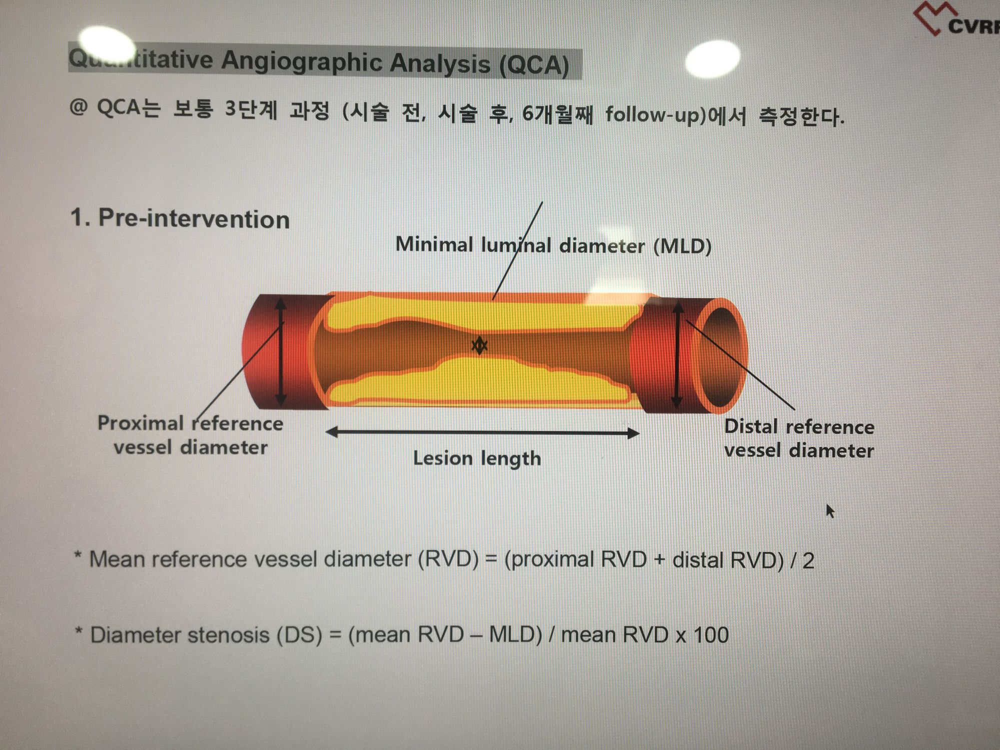

In [ ]:
# def calculate_QCA(array_2D,num_class):
#     results = list()
#     # Keep original in array_2D 
#     vessel = array_2D.copy()
#     vessel[vessel!=1] = 0
#     vessel[vessel!=0] = 1
#     array = array_2D.copy()

#     # grab only stenosis in segmentation
#     array[array!=2] = 0
#     array[array!=0] = 1
        
#     # check how many clusters
#     array = label(array)
    
# #     plt.imshow(array)
# #     plt.show()
    
#     for idx_cluster in range(1,len(np.unique(array))):
#         c = array.copy()
#         c[c!=idx_cluster] = 0
#         c[c!=0] = 1
#         c_temp = c.copy()
#         # c_temp는 정상주변 혈관을 grab한다. 그리고 label이 몇번까지 적용되는지 계산을 위해 사용됨
#         # proximal distal
        
#         c_temp=dilation(c_temp,disk(16))
        
#         plt.imshow(vessel)
#         plt.show()
#         plt.imshow(c_temp*vessel)
#         plt.show()
#         b,d = medial_axis(c, return_distance=True)

#         min_value = 0
#         max_value = int(np.max(d))
        
#         for idx_value in range(max_value): 
#             temp_d = d.copy()
#             temp_d[temp_d<idx_value] = 0  
#             temp_d[temp_d!=0] = 1
       
#             if min_value==0 and len(np.unique(label(temp_d)))>2:
#                 min_value=idx_value
        
#         QCA = (max_value-min_value)/(max_value+1e-8)*100 if min_value !=0 else 0
# #         print('QCA',QCA,min_value,max_value)
#         results.append(QCA)
        
#     return results
    
    
def QCA(array, vis=False):
    c = array.copy()
#     c[c!=1] = 0
#     c[c!=0] = 1
#     assert len(np.unique(c)) == 2
    b,d = medial_axis(c, return_distance=True)
    
    min_value = 0
    max_value = int(np.max(d))

    for idx_value in range(max_value): 
        temp_d = d.copy()
        temp_d[temp_d<idx_value] = 0  
        temp_d[temp_d!=0] = 1
        
        if vis:
            # 점점 줄어드는 과정 보기
            plt.title('idx_value_'+str(idx_value))
            plt.imshow(temp_d)
            plt.show()
            
        if min_value==0 and label(temp_d)[1]>=2:
            min_value=idx_value
        print('heee',label(temp_d)[1],min_value)

#     QCA = (max_value-min_value)/(max_value+1e-8)*100 if min_value !=0 else 0
    print('max_value{} min_value{}'.format(max_value,min_value))
#     plt.imshow(c)
    return max_value, min_value

def calculate_QCA(array_2D, num_class):
    locate = location(array_2D)
    results = list()
    # Keep original in array_2D 
    vessel = array_2D.copy()
    vessel[vessel!=1] = 0
    vessel[vessel!=0] = 1
    array = array_2D.copy()

    # grab only stenosis in segmentation
    array[array!=2] = 0
    array[array!=0] = 1
    
    if np.any(array):

        # check how many clusters
        array, index = label(array) # cluster 나뉘었다...

        # c_vessel는 정상주변 혈관을 grab한다. 그리고 label이 몇번까지 적용되는지 계산을 위해 사용됨
        # proximal distal
        c_vessel=dilation(array,disk(16))*vessel
        c_vessel_upper = c_vessel.copy()
        c_vessel_lower = c_vessel.copy()

        try:
            c_vessel_upper[:int(locate['y_stenosis_center'])] = 0
            c_vessel_lower[int(locate['y_stenosis_center']):] = 0
        except:
            pass
#         plt.subplot(131)
#         plt.imshow(c_vessel)
#         plt.subplot(132)
#         plt.imshow(c_vessel_upper)
#         plt.subplot(133)    
#         plt.imshow(c_vessel_lower)
#         plt.show()

        for idx_cluster in range(1,index+1):
            print(idx_cluster)
            c = array.copy()
            c[c!=idx_cluster] = 0
            c[c!=0] = 1

#             plt.imshow(vessel)
#             plt.show()
#             plt.imshow(c_vessel)
#             plt.show()

#             c_max, c_min = QCA(c, True) 
            c_max, c_min = QCA(c) 
            c_vessel_upper_max, c_vessel_upper_min = QCA(c_vessel_upper)
            c_vessel_lower_max, c_vessel_lower_min = QCA(c_vessel_lower)
            
            Mean_RVD = (c_vessel_upper_max + c_vessel_lower_max)/2
            QCA_result = (Mean_RVD-c_min)/(Mean_RVD+1e-8)*100 if c_min !=0 else 0
    #         print('QCA',QCA,min_value,max_value)
            print('check QCA{}, c_max{} c_min{}, c_vessel_upper_max{}, c_vessel_upper_min{}, c_vessel_lower_max{}, c_vessel_lower_min{}'.format(QCA_result,c_max,c_min, c_vessel_upper_max,c_vessel_upper_min, c_vessel_lower_max, c_vessel_lower_min))

            results.append(QCA_result)
    else:
        pass
    return results
        

def calculate_length(array_2D,num_class):    
    results = list()
    array = array_2D.copy()
    
    array[array!=2] = 0
    array[array!=0] = 1
    array,index = label(array)
    
    major_axis_length = 0
    
    for idx_cluster in range(1,len(np.unique(array))):
        
        c = array.copy()
        c[c!=idx_cluster] = 0
        c[c!=0] = 1
        
        if np.any(c):
            regions = regionprops(c.astype(np.uint8))
            for idx in range(len(regions)):
                results.append(regions[idx].major_axis_length)
        
    return results 

In [ ]:
# location(yhat[...,0])

In [ ]:
# QCA(yhat[...,0])

In [ ]:
fnames = list()
gts = list()
preds = list()
idx_slices = list()
min_values = list()
max_values = list()
gt_lengths = list()
pred_lengths = list()
ratios = list()

for idx in trange(len(list_x)):
    x = nib.load(list_x[idx])
    x = x.get_fdata()
    x = np.moveaxis(x,0,1)

    y = nib.load(list_y[idx])
    y = y.get_fdata()
    y = np.moveaxis(y,0,1)

    yhat = nib.load(list_yhat[idx])
    yhat = yhat.get_fdata()
    yhat = yhat.astype(np.uint8)
    yhat = np.moveaxis(yhat,0,1)
    
    for idx_slice in range(y.shape[-1]):
        fnames.append(list_x[idx].split('/')[-1])
        gts.append('Stenosis') if 2 in y[:,:,idx_slice] else gts.append('Normal')
        idx_slices.append(idx_slice+1)
        
        ratio = calculate_QCA(yhat[:,:,idx_slice], 2)
        gt_length = calculate_length(y[:,:,idx_slice], 2)
        pred_length = calculate_length(yhat[:,:,idx_slice], 2)
        gt_lengths.append(gt_length)
        pred_lengths.append(pred_length)

        try:
            if np.any(ratio):
                preds.append('Stenosis') if 2 in yhat[:,:,idx_slice] else preds.append('Normal') 
                ratios.append(ratio)
            else:
                preds.append('Normal') 
                ratios.append(None)
        except:
            ratios.append(None)

In [ ]:
df = pd.DataFrame([fnames,idx_slices,gts,gt_lengths,preds,pred_lengths,ratios],['FNAME','IDX_SLICE','GT','GT_LENGTH(mm)','PRED','PRED_LENGTH(mm)','STENOSIS_RATIO'])
df = df.T
df.to_csv('stenosis_result.csv',index=False)
df

In [ ]:
from skimage.morphology import * 

min_value = 0
total = int(np.max(d))
plt.figure(figsize=(60,60))
for idx in range(total): 
    plt.subplot(total,1,idx+1)
    plt.title(str(idx))
    temp_d = d.copy()
    temp_d[temp_d<idx] = 0  
    temp_d[temp_d!=0] = 1
    print(idx,np.unique(label(temp_d)))
    if min_value==0 and len(np.unique(label(temp_d)))>2:
        min_value=idx
    plt.imshow(temp_d)
    
print('\nmin_value/max_value',min_value,total,min_value/total)

In [ ]:
l = label(temp_d)
plt.figure(figsize=(20,20))
plt.imshow(l)

In [ ]:
plt.figure(figsize=(20,20))
plt.subplot(121)
plt.contour(a, [0.5], colors='w')
plt.imshow(d)
plt.subplot(122)
temp_d = d.copy()
temp_d[temp_d<12] = 0  
# temp_d[temp_d>8] = 0  
plt.imshow(temp_d)
np.unique(d)

In [ ]:
# plt.figure(figsize=(20,20))
# plt.contour(a, [0.5], colors='w')
# plt.imshow(b*d)

In [ ]:
TP= list()
TN= list()
FP= list()
FN= list()

for idx in range(len(list_y)):
    y = nib.load(list_y[idx])
    y = y.get_fdata()
    y_unique = np.unique(y)
    
    yhat = nib.load(list_yhat[idx])
    yhat = yhat.get_fdata()
    yhat_unique = np.unique(yhat)
    
    if np.max(y_unique) ==2 and np.max(yhat_unique) ==2:
        print(idx,'TP',list_y[idx])
        TP.append(list_yhat[idx])
    elif np.max(y_unique) == 1 and np.max(yhat_unique) ==2:
        print(idx,'FP',list_y[idx])
        FP.append(list_yhat[idx])
    elif np.max(y_unique) == 2 and np.max(yhat_unique) ==1:
        print(idx,'FN',list_y[idx])
        FN.append(list_yhat[idx])
    elif np.max(y_unique) == 1 and np.max(yhat_unique) ==1:
        print(idx,'TN',list_y[idx])
        TN.append(list_yhat[idx])
    else:
        print(idx,'????',list_y[idx])